In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

import datetime

plt.rcParams.update({'font.size': 32})

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI5 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI5")

### PM10

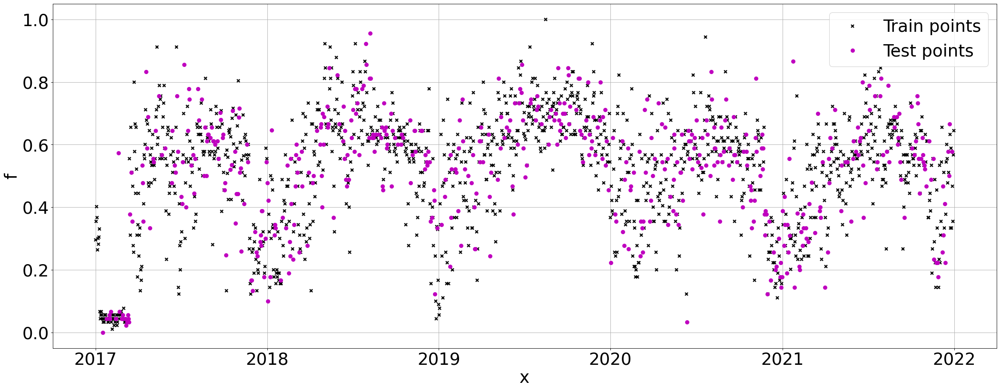

In [3]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI5.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI5['PM10']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.3, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI5['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI5['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [4]:
k1 = GPy.kern.StdPeriodic(1, period=2)
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
m1.optimize(messages=1, ipython_notebook=True)

In [5]:
m1

GP_regression.,value,constraints,priors
std_periodic.variance,1.1512282689495585,+ve,
std_periodic.period,1.9990284560849758,+ve,
std_periodic.lengthscale,0.07723242783691868,+ve,
Gaussian_noise.variance,0.016816813194066388,+ve,


In [6]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [7]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    mape = metrics.mean_absolute_percentage_error(true,predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('MAPE:', mape)

    print('R2 Square', r2_square)
    print('__________________________________')

In [8]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.10159605589764996
MSE: 0.017079850207908562
RMSE: 0.1306899009407711
MAPE: 907125742239.1377
R2 Square 0.49633686784900344
__________________________________


In [9]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.5442068324328525

In [10]:
# Pengambilan Data Forecasting
PM10_Index = np.arange(1826, 1857, dtype=np.int64)
PM10_Index = np.reshape(PM10_Index, (-1, 1))
PM10_Forecasting = m1.predict(PM10_Index)[0].flatten()

In [11]:
# Denormalisasi
max = 92.0
min = 2.0
PM10_Forecasting_denorm = (PM10_Forecasting.flatten() * (max - min) + min)
# PM10_Forecasting_denorm

### SO2

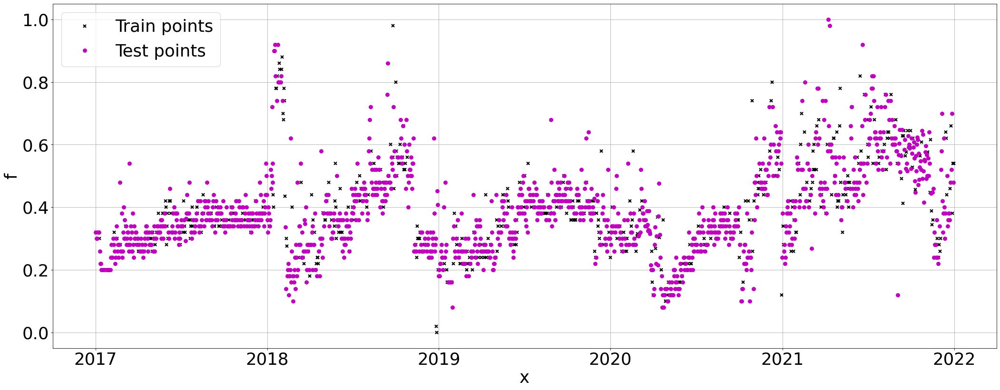

In [12]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI5.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI5['SO2']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.7, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI5['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI5['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [13]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize(messages=1, ipython_notebook=True)

In [14]:
m2

GP_regression.,value,constraints,priors
std_periodic.variance,1.1071841071399677,+ve,
std_periodic.period,1.9982093871373885,+ve,
std_periodic.lengthscale,0.21792689523515812,+ve,
Gaussian_noise.variance,0.012559195649706987,+ve,


In [15]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m2.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [16]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08361181696486861
MSE: 0.013181894574294147
RMSE: 0.11481243214170732
MAPE: 0.2634564947630402
R2 Square 0.3416152340736145
__________________________________


In [17]:
metrics.r2_score(train_Y.flatten(), m2.predict(train_X)[0].flatten())

0.4562328851817681

In [18]:
# Pengambilan Data Forecasting
SO2_Index = np.arange(1826, 1857, dtype=np.int64)
SO2_Index = np.reshape(SO2_Index, (-1, 1))
SO2_Forecasting = m2.predict(SO2_Index)[0].flatten()

In [19]:
# Denormalisasi
max = 51.0
min = 1.0
SO2_Forecasting_denorm = (SO2_Forecasting.flatten() * (max - min) + min)
# SO2_Forecasting_denorm

### CO

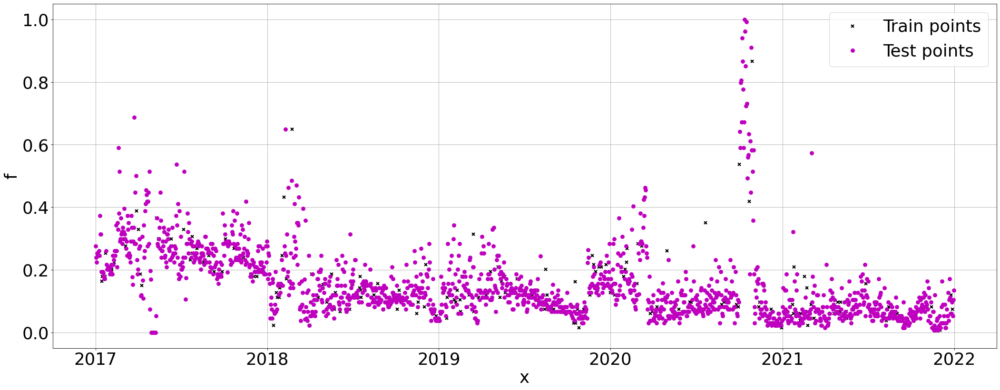

In [20]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI5.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI5['CO']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.9, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI5['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI5['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [21]:
k3 = GPy.kern.StdPeriodic(1, period=2)
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize(messages=1, ipython_notebook=True)

In [22]:
m3

GP_regression.,value,constraints,priors
std_periodic.variance,0.02113357721472702,+ve,
std_periodic.period,1.9992046266553571,+ve,
std_periodic.lengthscale,0.29999744065094974,+ve,
Gaussian_noise.variance,0.010508271912632315,+ve,


In [23]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m3.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [24]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06325776755549874
MSE: 0.01124554373375879
RMSE: 0.10604500805676234
MAPE: 6489807593295.578
R2 Square 0.21954730223732244
__________________________________


In [25]:
metrics.r2_score(train_Y.flatten(), m3.predict(train_X)[0].flatten())

0.21720918686601554

In [26]:
# Pengambilan Data Forecasting
CO_Index = np.arange(1826, 1857, dtype=np.int64)
CO_Index = np.reshape(CO_Index, (-1, 1))
CO_Forecasting = m2.predict(CO_Index)[0].flatten()

In [27]:
# Denormalisasi
max = 135.0
min = 1.0
CO_Forecasting_denorm = (CO_Forecasting.flatten() * (max - min) + min)
# CO_Forecasting_denorm

### O3

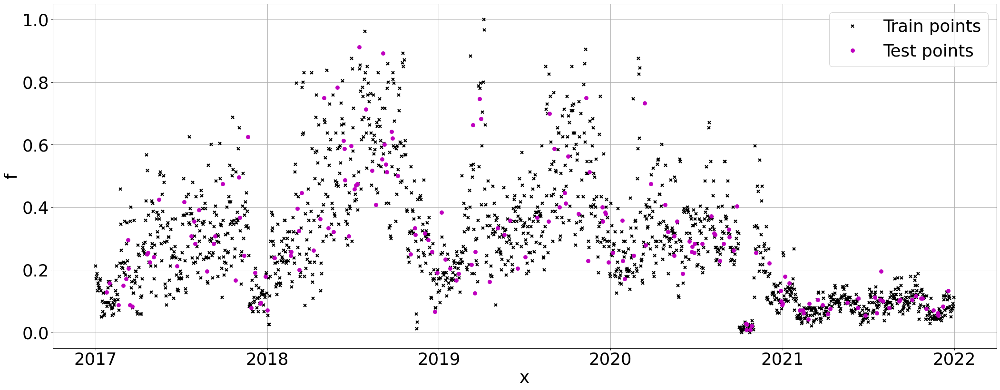

In [28]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI5.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI5['O3']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.1, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI5['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI5['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [29]:
k4 = GPy.kern.StdPeriodic(1, period=2)
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize(messages=1, ipython_notebook=True)

In [30]:
m4

GP_regression.,value,constraints,priors
std_periodic.variance,0.06992000879141867,+ve,
std_periodic.period,2.000003732819737,+ve,
std_periodic.lengthscale,0.00019834487881184148,+ve,
Gaussian_noise.variance,0.014351651202233945,+ve,


In [31]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m4.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [32]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08521838855301761
MSE: 0.013857062368215194
RMSE: 0.11771602426269413
MAPE: 0.6264401279127688
R2 Square 0.6206862584074149
__________________________________


In [33]:
metrics.r2_score(train_Y.flatten(), m4.predict(train_X)[0].flatten())

0.6358440101929197

In [34]:
# Pengambilan Data Forecasting
O3_Index = np.arange(1826, 1857, dtype=np.int64)
O3_Index = np.reshape(O3_Index, (-1, 1))
O3_Forecasting = m2.predict(O3_Index)[0].flatten()

In [35]:
# Denormalisasi
max = 243.0
min = 3.0
O3_Forecasting_denorm = (O3_Forecasting.flatten() * (max - min) + min)
# O3_Forecasting_denorm

### NO2

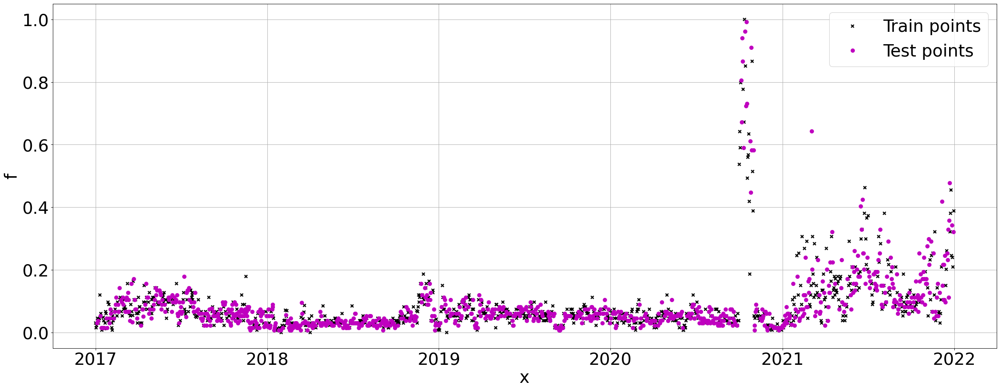

In [36]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI5.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI5['NO2']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.5, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI5['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI5['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [37]:
k5 = GPy.kern.StdPeriodic(1, period=2)
m5 = GPy.models.GPRegression(train_X, train_Y, k5)
m5.optimize(messages=1, ipython_notebook=True)

In [38]:
m5

GP_regression.,value,constraints,priors
std_periodic.variance,0.7276768531739283,+ve,
std_periodic.period,1.9994082897283516,+ve,
std_periodic.lengthscale,1.5750084424728854,+ve,
Gaussian_noise.variance,0.008320178974317586,+ve,


In [39]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m5.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [40]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m5.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.04705183846121697
MSE: 0.009350474321772224
RMSE: 0.0966978506574589
MAPE: 0.9295580365998733
R2 Square 0.1653434089637199
__________________________________


In [41]:
metrics.r2_score(train_Y.flatten(), m5.predict(train_X)[0].flatten())

0.16634294225567847

In [42]:
# Pengambilan Data Forecasting
NO2_Index = np.arange(1826, 1857, dtype=np.int64)
NO2_Index = np.reshape(NO2_Index, (-1, 1))
NO2_Forecasting = m2.predict(NO2_Index)[0].flatten()

In [43]:
# Denormalisasi
max = 135.0
min = 1.0
NO2_Forecasting_denorm = (NO2_Forecasting.flatten() * (max - min) + min)
# NO2_Forecasting_denorm

### Saving File

In [44]:
start = datetime.datetime.strptime("2022-01-01", "%Y-%m-%d")
date_generated = pd.date_range(start, periods=31)
# print(date_generated.strftime("%Y-%m-%d"))
date_generated

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-04',
               '2022-01-05', '2022-01-06', '2022-01-07', '2022-01-08',
               '2022-01-09', '2022-01-10', '2022-01-11', '2022-01-12',
               '2022-01-13', '2022-01-14', '2022-01-15', '2022-01-16',
               '2022-01-17', '2022-01-18', '2022-01-19', '2022-01-20',
               '2022-01-21', '2022-01-22', '2022-01-23', '2022-01-24',
               '2022-01-25', '2022-01-26', '2022-01-27', '2022-01-28',
               '2022-01-29', '2022-01-30', '2022-01-31'],
              dtype='datetime64[ns]', freq='D')

In [45]:
d = {"Tanggal":date_generated, "PM10":PM10_Forecasting_denorm, "SO2":SO2_Forecasting_denorm, "CO":CO_Forecasting_denorm, "O3":O3_Forecasting_denorm, "NO2":NO2_Forecasting_denorm}
DKI5_Forecasting = pd.DataFrame(d)
DKI5_Forecasting

,Tanggal,PM10,SO2,CO,O3,NO2
0,2022-01-01,45.135637,16.324628,42.070002,76.558212,42.070002
1,2022-01-02,52.331130,17.421302,45.009090,81.822250,45.009090
2,2022-01-03,46.040192,16.004506,41.212076,75.021629,41.212076
3,2022-01-04,53.615119,17.152276,44.288098,80.530923,44.288098
4,2022-01-05,47.009301,15.691604,40.373500,73.519701,40.373500
5,2022-01-06,54.973259,16.888290,43.580618,79.263793,43.580618
6,2022-01-07,48.042914,15.386344,39.555403,72.054452,39.555403
7,2022-01-08,56.405172,16.629730,42.887675,78.022702,42.887675
8,2022-01-09,49.140827,15.089130,38.758869,70.627825,38.758869
9,2022-01-10,57.910288,16.376966,42.210268,76.809435,42.210268


In [46]:
# Penyimpanan Data Forecasting
DKI5_Forecasting.to_excel('./Data/Forecasting/DKI5_Forecasting.xlsx', index=False)